# 7. Extracting Image Features and Descriptors

Finally. We made it to the really cool stuff. We're going to talk about feature detectors & descriptors, look at the types that are out there, and pat ourselves on the back a little bit that we have a basic understanding of image processing, and know what goes into the deep learning algorithms. Specifically, we'll cover:<ul><li>detectors vs. descriptors, & extraction</li><li>harris corner detector</li><li>blob detectors with LoG, DoG, and DoH</li><li>HOG! HOG! HOG! HOG!</li><li>SIFT, ORB, and BRIEF features and their application in image matching</li><li>Haar-like features and their application in face detection</li></ul>

Welcome to the party.

## Detectors vs. Descriptors

<strong>Detectors</strong> are a family of algorithms that choose a set of interest ponts based on corners, local max/min, etc.. On the other hand, <strong>descriptors</strong> represnets the image with those characteristics, transforming the image into a set of descriptors, performing a sort of dimensionality reduction. A <em>feature</em>, then, is formed by an interest point and its descriptor together.

To implement these, we'll be using `python-opencv` like the big kids.

In [15]:
from matplotlib import pyplot as plt
from skimage.io import imread

from skimage.color import rgb2gray
from skimage.feature import corner_harris, corner_subpix, corner_peaks
from skimage.transform import warp, SimilarityTransform, AffineTransform, resize
import cv2
import numpy as np
from skimage import data
from skimage.util import img_as_float
from skimage.exposure import rescale_intensity
from skimage.measure import ransac

### The Harris Corner Detector

This fella explores intensity changes within a window (kernel). While edges represent pixels whose values change abruptly in one direction, corners represent points where the values change abruptly in all directions. So as the kernel traverses the array (we can just call it that by now, right?), the intensity value should change drastically. That is what the Harris Corner Detector looks out for.

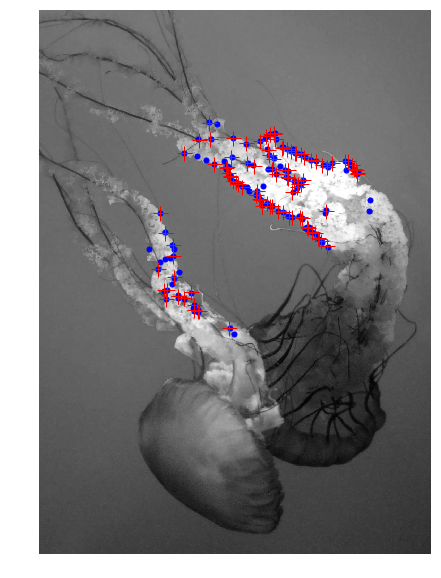

In [28]:
img = imread('./img/jellyfish_crop.jpg')
img_gray = rgb2gray(img)
# play with the k and min_distance values to see variation in the result
coords = corner_peaks(corner_harris(img_gray, k=0.001), min_distance=3)
coords_subpix = corner_subpix(img_gray, coords, window_size=13)

# img[coords > 0.01 * coords.max()] = [255, 0, 0, 255]
plt.figure(figsize=(20, 10))
plt.imshow(img_gray, interpolation='nearest', cmap=plt.cm.gray)
plt.plot(coords[:, 1], coords[:, 0], '.b', markersize=10)
plt.plot(coords_subpix[:, 1], coords_subpix[:, 0], '+r', markersize=15)
plt.axis('off')
plt.show()

<IPython.core.display.Javascript object>


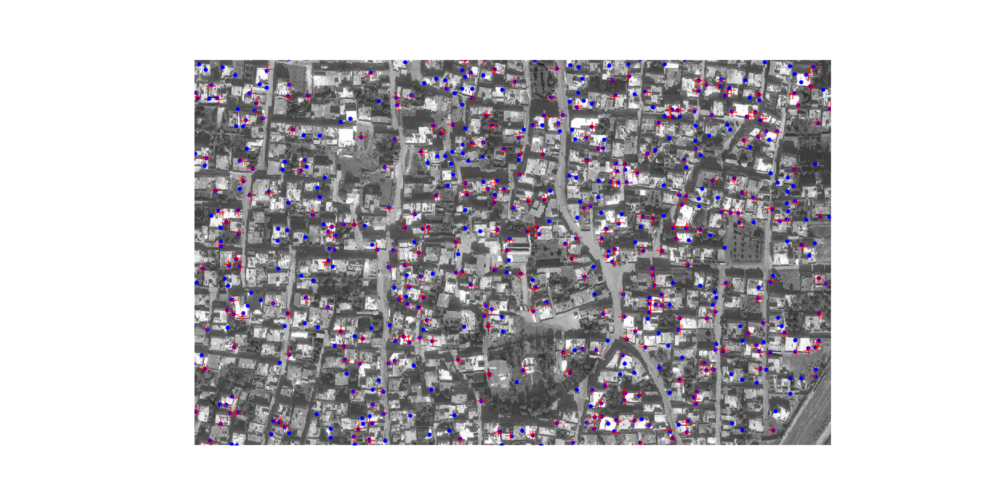

In [43]:
%matplotlib notebook
import cv2
# from skimage.external import tifffile
# call_plugin('imread', tifffile)
homs = cv2.imread('./img/homs_2018_11_20wv03_R4C1.tif')
homs = rgb2gray(homs)
# play with the k and min_distance values to see variation in the result
coords = corner_peaks(corner_harris(homs, k=0.001), min_distance=12)
coords_subpix = corner_subpix(homs, coords, window_size=25)

# img[coords > 0.01 * coords.max()] = [255, 0, 0, 255]
plt.figure(figsize=(20, 10))
plt.imshow(homs, interpolation='nearest', cmap=plt.cm.gray)
plt.plot(coords[:, 1], coords[:, 0], '.b', markersize=10)
plt.plot(coords_subpix[:, 1], coords_subpix[:, 0], '+r', markersize=15)
plt.axis('off')
plt.show()

In [38]:
homs.shape

(8192, 8148)

## Blob Detectors with LoG, DoG, and DoH

### LoG

'Member zero crossings from awhile back? Well, that's the beginning of blob detection. We saw LoG (<strong>Laplacian of Gaussian</strong>) as a technique for edge detection, and we'll see how we can use it to find scale-invariant regions by searching location & scale extrema of the LoG, using yet another domain now: that of <em>Scale Space</em>. If the scale of Laplacian $\sigma$ is matched with the scale of the blob, the the result contains maximum (brighter) values corresponding with the blob. This only detects bright blobs on dark backgrounds. It's accurate, but at the expense of being slow (particularly if the blobs are large.

### Difference of Gaussian (DoG)

A faster approximation of LoG. The image is smoothed with a Gaussian kernel with increasing $\sigma$ values, and the difference between the smoothed images is stacked in a cube. 

### Determinant of Hessian (DoH)

This is the fastest of hte approaches. It computes a Determinant of Hesssian matrix over the image, and computes the maximums of that. This also has the benefit of detecting dark blobs on light backgrounds, but small blobs are not detected accurately.

Let's do all three at once:

In [53]:
from numpy import sqrt
from skimage.feature import blob_dog, blob_log, blob_doh

img = imread('./img/pumpkin.jpg')
img_gray = rgb2gray(img)
log_blobs = blob_log(img_gray, max_sigma=30, num_sigma=10, threshold=0.1)
log_blobs[:, 2] = sqrt(2) * log_blobs[:, 2]  # compute radius in the 3rd column
dog_blobs = blob_dog(img_gray, max_sigma=30, threshold=0.1)
dog_blobs[:, 2] = sqrt(2) * dog_blobs[:, 2]
doh_blobs = blob_doh(img_gray, max_sigma=30, threshold=0.1)
list_blobs = [log_blobs, dog_blobs, doh_blobs]
colors, titles = ['yellow', 'lime', 'red'], ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
seq = zip(list_blobs, colors, titles)

In [51]:
%matplotlib notebook

<IPython.core.display.Javascript object>


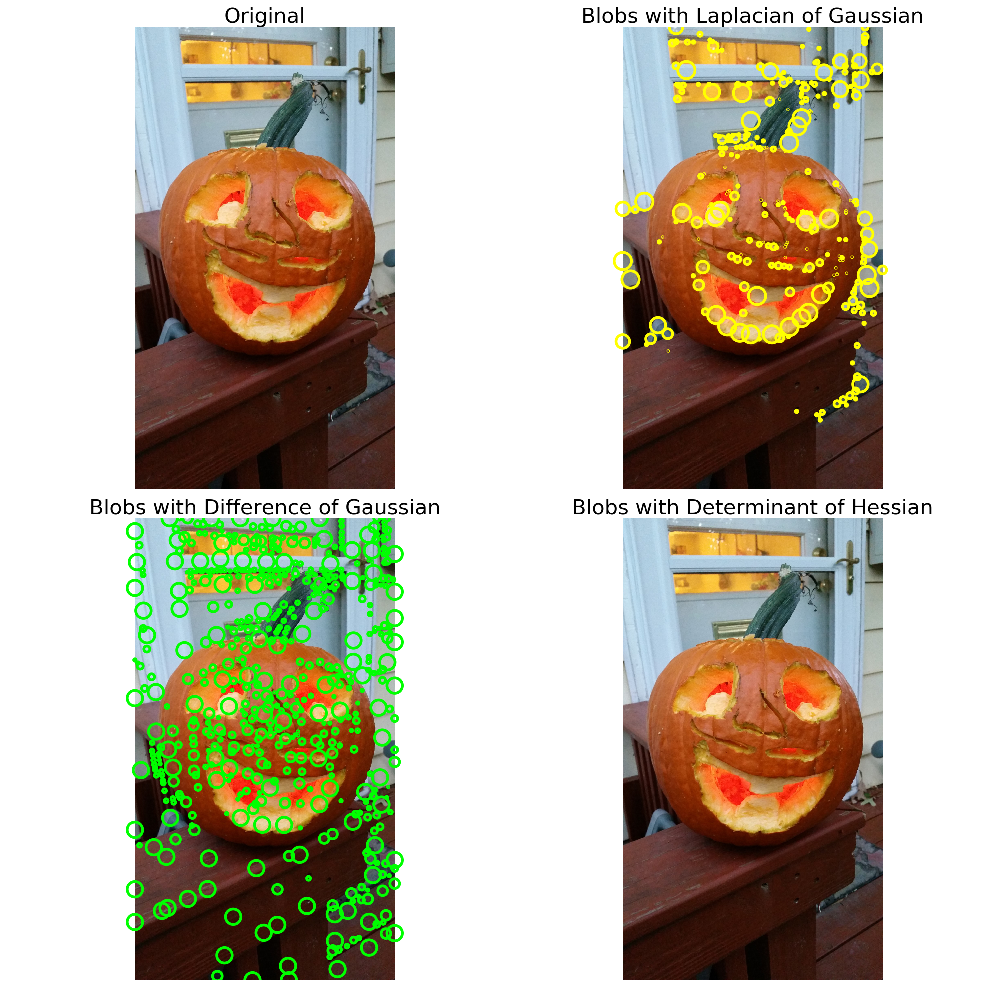

In [54]:
fig, axes = plt.subplots(2, 2, figsize=[20, 20], sharex=True, sharey=True)
axes = axes.ravel()
axes[0].imshow(img, interpolation='nearest')
axes[0].set_title('Original', size=30)
axes[0].set_axis_off()
for idx, (blobs, color, title) in enumerate(seq):
    axes[idx+1].imshow(img, interpolation='nearest')
    axes[idx+1].set_title('Blobs with ' + title, size=30)
    for blob in blobs:
        y, x, row = blob
        col = plt.Circle((x, y), row, color=color, linewidth=4, fill=False)
        axes[idx+1].add_patch(col)
    axes[idx+1].set_axis_off()
plt.tight_layout()
plt.show()

## Histogram of Oriented Gradients (HoG)

In this decade, this algorithm has become quite popular for object detection. Here's how to perform it:<ol><li>Globally normalize the image</li><li>Compute the horizontal and vertical gradient images</li><li>compute the gradient histograms</li><li>Normalize across blocks</li><li>Flatten into a feature descriptor vector</li></ol>

So let's do this with scikit-image, on our satellite image of Homs:

In [55]:
from skimage.feature import hog
from skimage import exposure

In [58]:
img = rgb2gray(cv2.imread('./img/homs_2018_11_20wv03_R4C1.tif'))
fd, hog_image = hog(img, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(8, 8),
                   visualize=True)
print(img.shape, len(fd))

/home/ben/.local/lib/python3.6/site-packages/skimage/feature/_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)


(8192, 8148) 129797120


<IPython.core.display.Javascript object>


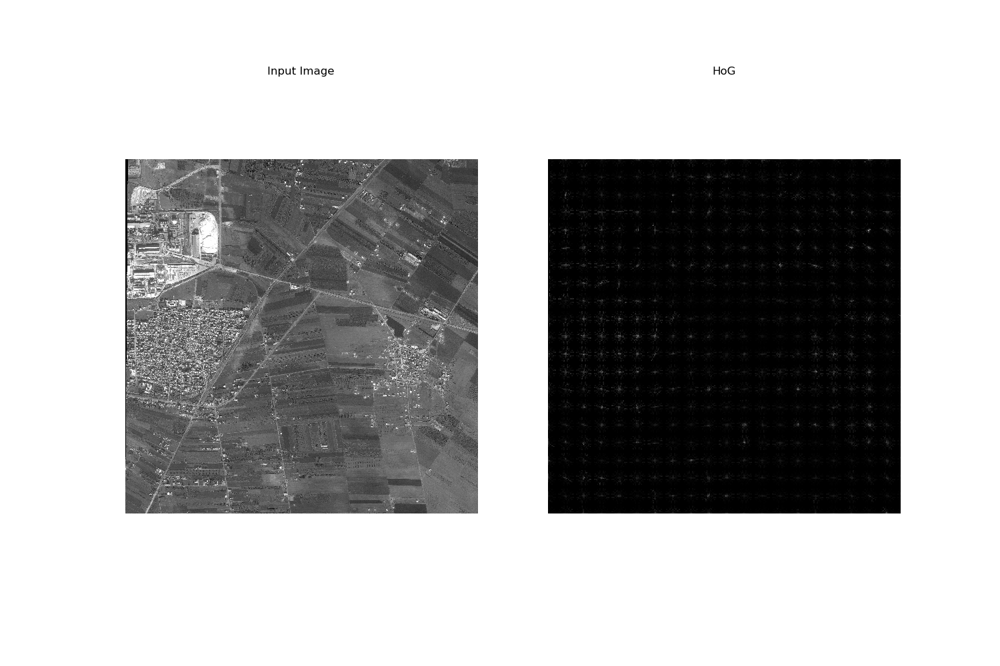

In [59]:
fig, (axes1, axes2) = plt.subplots(1, 2, figsize=(15, 10), sharex=True, sharey=True)
axes1.axis('off')
axes1.imshow(img, cmap=plt.cm.gray)
axes1.set_title('Input Image')

hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
axes2.axis('off')
axes2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
axes2.set_title('HoG')
plt.show()

Not a big payoff with this, as this is gridded out quite coarsely, and the "objects" detected are really tiny. We'll get to applying this later, though.

### SIFT (Scale-Invariant Feature Transform)

This is another descriptor that provides an alternative representation for image regions and a tool for matching images. When images are similar in nature with regard to scale, orientation, etc., corner detectors suffice for matching. Otherwise, SIFT descriptors are necessary. This method works for scale, of course, but also works when rotation, illumination, and viewpoints change.

To perform it, <ol><li><strong>Detect Scale Space Extrema</strong>: search over multiple scales and image locations, using DoG</li><li><strong>Localize Keypoints</strong>: select keypoints based on a measure of stability, keeping only the strongest points by eliminating low-contrast and edge points</li><li><strong>Assign Orientation</strong>: compute the best orientation for each keypoint region, to contribute to match-stability</li><li><strong>Compute Keypoint Descriptors</strong>: use local image gradients at the selected scale and rotation to describe each keypoint region.</li></ol>

We'll use `python-opencv` to perform SIFT, and to do so we'll need to install `opencv-contrib`

Oops - according to pypi.org, we should only install one package for opencv, and we already installed one. So let's uninstall it first, then go back and get the bigger one.

I also need to use pip3, and add the `--user` argument so it just installs for me and not to a directory only available to root.

In [68]:
import cv2
img = cv2.imread('./img/kolya.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(gray, None)

AttributeError: module 'cv2.cv2' has no attribute 'xfeatures2d'

In [65]:
import sys
print(sys.path)

['', '/usr/lib/python36.zip', '/usr/lib/python3.6', '/usr/lib/python3.6/lib-dynload', '/home/ben/.local/lib/python3.6/site-packages', '/usr/local/lib/python3.6/dist-packages', '/usr/lib/python3/dist-packages', '/home/ben/.local/lib/python3.6/site-packages/IPython/extensions', '/home/ben/.ipython']


Been trying this for an hour - it's not going to work.

<img src="./img/gm.gif" />

Moving on to 

### Matching Images with BRIEF Binary Descriptors with Scikit-Image

I guess <em>no one</em> feels the need to define acronyms anymore. Wasn't in the book, wasn't in the scikit-image docs, but it was sort of in wikipedia: Binary Robust Independent Elementary Features

In [69]:
from skimage import transform
from skimage.feature import match_descriptors, corner_peaks, corner_harris, plot_matches, BRIEF

In [70]:
img = rgb2gray(imread('./img/kolya.jpg'))
affine_trans = transform.AffineTransform(scale=(1.2, 1.2), translation=(0, -100))
img2 = transform.warp(img, affine_trans)
img3 = transform.rotate(img, 25)
coords1, coords2, coords3 = corner_harris(img), corner_harris(img2), corner_harris(img3)
coords1[coords1 > 0.01 * coords1.max()] = 1
coords2[coords2 > 0.01 * coords2.max()] = 1
coords3[coords3 > 0.01 * coords3.max()] = 1
kp1 = corner_peaks(coords1, min_distance=5)
kp2 = corner_peaks(coords2, min_distance=5)
kp3 = corner_peaks(coords3, min_distance=5)

In [71]:
extractor = BRIEF()
extractor.extract(img, kp1)
kp1, desc1 = kp1[extractor.mask], extractor.descriptors
extractor.extract(img2, kp2)
kp2, desc2 = kp2[extractor.mask], extractor.descriptors
extractor.extract(img3, kp3)
kp3, desc3 = kp3[extractor.mask], extractor.descriptors

<IPython.core.display.Javascript object>


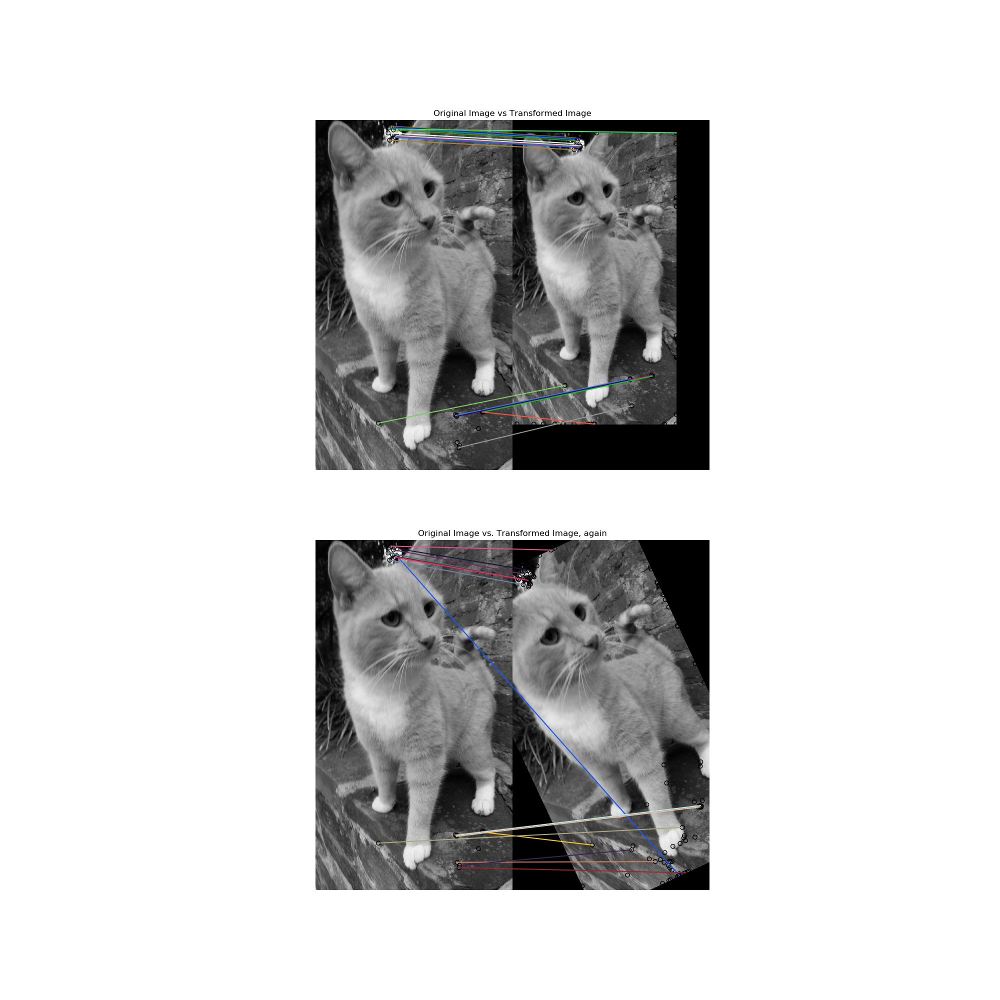

In [73]:
matches12 = match_descriptors(desc1, desc2, cross_check=True)
matches13 = match_descriptors(desc1, desc3, cross_check=True)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 20))
plt.gray()
plot_matches(axes[0], img, img2, kp1, kp2, matches12)
axes[0].axis('off')
axes[0].set_title("Original Image vs Transformed Image")
plot_matches(axes[1], img, img3, kp1, kp3, matches13)
axes[1].axis('off')
axes[1].set_title("Original Image vs. Transformed Image, again")
plt.show()

### Haar-Like Features

These are features detected by a series of small, simple kernels passed over an image, with each resembling some facial feature, such as eyebrows, lips, the nose, and their associated shadows. The other key feature of the algorithm relies on the relative darkness of the eyes.

Let's try this with scikit-image.

In [ ]:
from skimage.feature import haar_like_feature_coord
from skimage.feature import draw_haar_like_feature
images = [np.zeros((2, 2)), np.zeros((2, 2)), np.zeros((3, 3))], np.zeros((3, 3)), np.zeros((2, 2))]
feature_types = ['type-2-x', 'type-2-y', 'type-3-x', 'type-3-y', 'type-4']
fig, axes = plt.subplots(3, 2, figsize=(5, 7))
for axes, img, feat_t = zip(np.ravel(axes), images, feature_types):
    coords, _  = haar_like_feature_coord(img.shape[0], img.shape[1], feat_t)
    haar_feature = draw_haar_like_feature(img, 0, 0)